# Makemore: MLP

In the previos notebook we have implemented makemore, a bigram character languagde model, We have followed two approaches: simple counts of bigrams in a lookup table and a simple NN.

The logic of the count approach is that we pick a character and predict the probability distribution of what character comes next. Thus works, but the model performs poorly as it only takes bigrams. Scaling this approach is infeasible as the lookup table will gro exponentially with the number of characters considered (number of unique chars to the power of chars considered).

Therefore, we follow the MLP approch in this notebook which can is easily scalable. The approach follows the paper by Bengio et al. (2003).

__Bengio et al. (2003)__

- The paper proposes a word-level model, we will instead implement a char level model.

- Idea: Every word is embedded into a 30-D vector. These are intiliased randomly in the vector space at the beginning. The MLP learns the optimal vectors to maximise the log likelihhod of word sequences. During training these vectors move around in that space and eventually similar words will end up in similar spaces.

- Advantage: This idea can perform well on out-of-distribution predictions. Say the training data has the sentences "The cat is running in a _". The MLP may have never seen the exact same phrase but it may have seen the phrase "The _dog_ is running in a room". Because similar words end up in similar vector spaces, such as cat and dog as they are pets, the model can transfer knowledge between these embeddings and fill in the blank.

- Architecture: 

    - Input layer: They take three previos words and try to predcit the fourth word in a sequence. `C` is a lookuptable of dimension `size_vocab x size layer` where each row stores the weights of the words in the vocabulary. Thus, each row in this matrix is the embedding vector of the word. The _input layer_ consists then of three word, each consisting of `size layer` neurons.

    - Hidden layer: The hidden layer is fully connected to the inut layer. The size of the hidden layer is a hyperparamter to be determined. The activation of the hidden layer is `tanh`.

    - Output layer: Is fully connected to the hidden layer, and of the same size as the vocabulary. The activation function is softmax which transforms the logits into probabilites. The ouput is a probability distribution for the next word in the sequence.

- The aim is to optimise the weights and biases of the output, hidden and embedding layer. The latter is finding the best word embeddings.


In [1]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import random
%matplotlib inline

## Data

In [2]:
# Load data, read data, and split by lines which creates a list of names
words = open("/Users/gerritquaremba/Library/CloudStorage/GoogleDrive-g.quaremba@gmail.com/My Drive/08_NN_Kaparthy/makemore/names.txt", 'r').read().splitlines()

We want to map each char to a unique integer, and vice versa:

In [3]:
# stoi = string to integer
chars = sorted(list(set(''.join(words))))
stoi = {s: i+1 for i, s in enumerate(chars)}
stoi['.']=0

# itos = integer to string
itos = {i: s for s, i in stoi.items()}

Now we can build the data size with a `block_size` which is the context window. The `context` variable is the input to the neural net. The context is updated with each iteration of the char of a word. The beginning of the `context` variable is padded with dots.

In [4]:
# Build sets
# Data set
block_size=3 # Context window
X, Y = [], [] # In- and output

for word in words:
    context = [0]*block_size # creates the context window which is populated next; also sets the beginning chars

    for char in word + '.':
        ix=stoi[char]
        X.append(context)
        Y.append(ix)
        
        # Update context: last two become first two + new token
        context=context[1:] + [ix]
        
# Create tensors
X = torch.tensor(X)
Y = torch.tensor(Y)

# Split into train, dev, test
random.seed(42)
random.shuffle(words) # Shuffle order
n1 = int(.8*len(words)) # Get ints for .8 and .9 percent of the data
n2 = int(.9*len(words))

Xtr, Ytr = X[:n1], Y[:n1]
Xdev, Ydev = X[n1:n2], Y[n1:n2]
Xte, Yte = X[n2:], Y[n2:]

emma
X input  ...
Y label  e
X input  ..e
Y label  m
X input  .em
Y label  m
X input  emm
Y label  a
X input  mma
Y label  .
olivia
X input  ...
Y label  o
X input  ..o
Y label  l
X input  .ol
Y label  i
X input  oli
Y label  v
X input  liv
Y label  i
X input  ivi
Y label  a
X input  via
Y label  .
ava
X input  ...
Y label  a
X input  ..a
Y label  v
X input  .av
Y label  a
X input  ava
Y label  .
isabella
X input  ...
Y label  i
X input  ..i
Y label  s
X input  .is
Y label  a
X input  isa
Y label  b
X input  sab
Y label  e
X input  abe
Y label  l
X input  bel
Y label  l
X input  ell
Y label  a
X input  lla
Y label  .
sophia
X input  ...
Y label  s
X input  ..s
Y label  o
X input  .so
Y label  p
X input  sop
Y label  h
X input  oph
Y label  i
X input  phi
Y label  a
X input  hia
Y label  .


In [5]:
# Multiply xenc with the weights
xenc @ W

NameError: name 'xenc' is not defined

In [6]:
# Check X and Y tensors
X.shape, Y.shape

(torch.Size([32, 3]), torch.Size([32]))

We have an input tensor `X` which is of dim `num_examples x block_size` and the corresponding lables in `Y` with dimension`num_examples x 1`. Thus, each input to the neural net is of size three.

## Neural Network

Next, we build the NN architecture using PyTorch.

- Input layer: This layers ambedds the words into a lower dimensional rerpesentation. We have a char size of 27, so can choose a number below that to embedd the layer.

- Hidden layer: The hidden layer takes an input of size `block_size x embedding _dimensions` as input. The number of neurons of this layer is a hyperparameter.

### Input layer

In [7]:
# Set seed
g = torch.Generator().manual_seed(2147483647)

# Embedding layer
# Weight matrix

C = torch.randn((27, 2), generator=g) # Size of vocabulary x embedding size

Before we implement the next char, we demonstrate two ways how the embedding workds.

1. Matrix multiplication

2. Indexing

In [8]:
# Matrix multiplication
# Get one-hot vector
one_hot_five = F.one_hot(torch.tensor([5]), num_classes=27).float()

one_hot_five @ C

tensor([[-0.4713,  0.7868]])

In [9]:
# Indexing
C[5]

tensor([-0.4713,  0.7868])

When feeding integers into a NN, matrix mutliplication is the same as indexing. This is because the on-hot vectos is 0 for all other values, and thus the multiplicationn effectively chosses the row of the wieghts matrix corresponding to the integer value. INdexing is faster, which is why we do not perform one-hot endcoding.

__Embedding__

We can interpret the first layer as accessing the embedded vectors for each word through indexing the matrix `C`. Importantly, this layer is optimisable, that is, we optimise the weights of the lower dimensional representation.

Next, we want not only to embedd a single integer but the entire training data `X`. This works smoothly by simply using `X`'s integers as an index vector for `C`:

In [10]:
# Indexing C
emb = C[X]

What is interesting the resulting tensor's shape. The first dimension is the size of the training inputs. The second dimension is the context window. And the third dimension is the number of neurons in the mebedding layer. The resulting matrix outputs the embedded layers for each training input.

In [11]:
# Shape
emb.shape

torch.Size([32, 3, 2])

### Hidden Layer

The hidden layer cannot be simply mutliplied with the embedding layer, as the latter is a 3-D torch. This is beacuse the contex and embedding dimesions are stacked. We want to unstack those to feed a `2*3` (embedding dim times context size) into the hiden layer. This is because, as in the model above, we want to feed all neurons of the block size into the hidden layer. As we have three prior words and an embedding size of two, the number of resulting, concatenated neurons is 6.

There are multiple ways to unstack or concatenate:

- Concatenate: `torch.cat()` takes a sequence of tensors and concatentate those along a speccifie dimension. The problem here is that we would need to manually insert the latter two dims, which we had to change if we use another block size. We could use this then in combination with `torch.unbind()` to make it flexible for any block size.

- View: Is an efficient way to change the structure of a torch object. `torch.view()` does soley change the view without removing or manipulating any data. This is more effieicnt than the above solution, where intermediate tensors are stored which take up memory.

In [16]:
# View to reshape emb
emb.view(32, 6)

tensor([[ 1.5674, -0.2373,  1.5674, -0.2373,  1.5674, -0.2373],
        [ 1.5674, -0.2373,  1.5674, -0.2373, -0.4713,  0.7868],
        [ 1.5674, -0.2373, -0.4713,  0.7868,  2.4448, -0.6701],
        [-0.4713,  0.7868,  2.4448, -0.6701,  2.4448, -0.6701],
        [ 2.4448, -0.6701,  2.4448, -0.6701, -0.0274, -1.1008],
        [ 1.5674, -0.2373,  1.5674, -0.2373,  1.5674, -0.2373],
        [ 1.5674, -0.2373,  1.5674, -0.2373, -1.0725,  0.7276],
        [ 1.5674, -0.2373, -1.0725,  0.7276, -0.0707,  2.4968],
        [-1.0725,  0.7276, -0.0707,  2.4968,  0.6772, -0.8404],
        [-0.0707,  2.4968,  0.6772, -0.8404, -0.1158, -1.2078],
        [ 0.6772, -0.8404, -0.1158, -1.2078,  0.6772, -0.8404],
        [-0.1158, -1.2078,  0.6772, -0.8404, -0.0274, -1.1008],
        [ 1.5674, -0.2373,  1.5674, -0.2373,  1.5674, -0.2373],
        [ 1.5674, -0.2373,  1.5674, -0.2373, -0.0274, -1.1008],
        [ 1.5674, -0.2373, -0.0274, -1.1008, -0.1158, -1.2078],
        [-0.0274, -1.1008, -0.1158, -1.2

With the reshaped `emb` tensor we can multiply the hidden layer. This results in a `32x6` mutliplied by a `6 times 100` layer of dim `32x100`. We can parametrise the dimensions of view using the dims of the emebedding layer.

In [17]:
# Hidden layer
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn((100), generator=g)

# emb times hidden layer inside tanh
h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100
h.shape

torch.Size([32, 100])

This is the hidden layer.

do braodcasting

### Output layer

The output layer takes the resulsts of the hidden layer as an input and outputs a matrix of size `inputted examples x len of unique chars`. This matrix contains the probaility distribution of the next token for each example yielded by the softmax

In [18]:
# Weights and biases of the hidden layer
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn((27), generator=g)

# Compute logists
logits = (h @ W2 + b2)

# Softmax to obtain probs
counts = logits.exp() # These are the counts
probs = counts / counts.sum(1, keepdims=True) # This is the normalisation of counts

probs.shape


torch.Size([32, 27])

In [19]:
# Check whether row sums sum to 1
probs.sum(1)

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000])

### Loss function

For the loss function we want to get the probability for each correct label to be a compound of the loss. We can use the true label vecto `Y` to index the probs.

In [20]:
# Compute the NLL loss
loss= -probs[torch.arange(32), Y].log().mean() # index true lables, get their log, minus, and mean
loss

tensor(17.7697)

We can count all parameters of the nn the following way:

In [21]:
# All weights and biases in one list
params = [C, W1, b1, W2, b2]
sum(p.nelement() for p in params)

3481

#### Cross-entropy loss

Instead of cmputing the loss manually, we can use PyTorch. This is more efficient than doing it by our own. Also, when we encounter a extremely high number in the logits and exponentaite it manually, we might get a `inf` back which creates trouble in the computation of the loss. The cross-entropy function in PyTorch acocunts for this. It does so by interanlly finding the max number in the logit and substracts tthis from all logits. This allows getting the exponentiated value for high values whie leaving the porbabilirty distribution untocuhed.

The cross-entropy loss can be computed as follows:


In [111]:
# Cross entropy loss
F.cross_entropy(logits, Y)

tensor(17.7697)

_Question_ Is cross-entropy the same as NLL?

## Training

We put the nn together by first initialising parameters, and second running the forward and backward pass for `e` iterationss. running the nn on just a small batch leads to overfitting as we run with significanlty more paramters. The reason why we still do not get a loss of 0 is because the very first chars ('...') are supposed to predict different chars such as "a", "o", etc. which is difficult to learn with just a small batch.


In [22]:
# PARAMETERS
# Set seed
g = torch.Generator().manual_seed(2147483647)

# Embedding matrix
C = torch.randn((27, 2), generator=g) # Size of vocabulary x embedding size

# Hidden layer
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn((100), generator=g)

# Output layer
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn((27), generator=g)

# Params list
params = [C, W1, b1, W2, b2]

# Set gradients
for p in params:
    p.requires_grad=True


In [23]:
# Model Training
for e in range(100): # iterations

    #  FORWARD PASS
    # Emedding layer
    emb = C[X]

    # Hidden layer
    h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100

    # Output layer
    logits = (h @ W2 + b2)

    # Loss: cross-entropy
    loss=F.cross_entropy(logits, Y)
    print(loss)

    # BACKWARD PASS
    for p in params:
        p.grad=None # Same as setting it to 0

    # Backprop
    loss.backward()

    # Gradient descent
    for p in params:
        p.data+=-0.1*p.grad

tensor(17.7697, grad_fn=<NllLossBackward0>)
tensor(13.6564, grad_fn=<NllLossBackward0>)
tensor(11.2988, grad_fn=<NllLossBackward0>)
tensor(9.4525, grad_fn=<NllLossBackward0>)
tensor(7.9843, grad_fn=<NllLossBackward0>)
tensor(6.8913, grad_fn=<NllLossBackward0>)
tensor(6.1000, grad_fn=<NllLossBackward0>)
tensor(5.4520, grad_fn=<NllLossBackward0>)
tensor(4.8982, grad_fn=<NllLossBackward0>)
tensor(4.4147, grad_fn=<NllLossBackward0>)
tensor(3.9858, grad_fn=<NllLossBackward0>)
tensor(3.6028, grad_fn=<NllLossBackward0>)
tensor(3.2621, grad_fn=<NllLossBackward0>)
tensor(2.9614, grad_fn=<NllLossBackward0>)
tensor(2.6983, grad_fn=<NllLossBackward0>)
tensor(2.4697, grad_fn=<NllLossBackward0>)
tensor(2.2717, grad_fn=<NllLossBackward0>)
tensor(2.1013, grad_fn=<NllLossBackward0>)
tensor(1.9572, grad_fn=<NllLossBackward0>)
tensor(1.8375, grad_fn=<NllLossBackward0>)
tensor(1.7381, grad_fn=<NllLossBackward0>)
tensor(1.6535, grad_fn=<NllLossBackward0>)
tensor(1.5791, grad_fn=<NllLossBackward0>)
tensor(1

### Full data

Now let us use the entire data set instead of five words only:

In [24]:
# Data set

block_size=3 # Context window
X, Y = [], [] # In- and output

for word in words:
    print(word)
    context = [0]*block_size # creates the context window which is populated next; also sets the beginning chars

    for char in word + '.':
        ix=stoi[char]
        X.append(context)
        Y.append(ix)
        
        # Update context: last two become first two + new token
        context=context[1:] + [ix]
        
# Create tensors
X = torch.tensor(X)
Y = torch.tensor(Y)

emma
olivia
ava
isabella
sophia
charlotte
mia
amelia
harper
evelyn
abigail
emily
elizabeth
mila
ella
avery
sofia
camila
aria
scarlett
victoria
madison
luna
grace
chloe
penelope
layla
riley
zoey
nora
lily
eleanor
hannah
lillian
addison
aubrey
ellie
stella
natalie
zoe
leah
hazel
violet
aurora
savannah
audrey
brooklyn
bella
claire
skylar
lucy
paisley
everly
anna
caroline
nova
genesis
emilia
kennedy
samantha
maya
willow
kinsley
naomi
aaliyah
elena
sarah
ariana
allison
gabriella
alice
madelyn
cora
ruby
eva
serenity
autumn
adeline
hailey
gianna
valentina
isla
eliana
quinn
nevaeh
ivy
sadie
piper
lydia
alexa
josephine
emery
julia
delilah
arianna
vivian
kaylee
sophie
brielle
madeline
peyton
rylee
clara
hadley
melanie
mackenzie
reagan
adalynn
liliana
aubree
jade
katherine
isabelle
natalia
raelynn
maria
athena
ximena
arya
leilani
taylor
faith
rose
kylie
alexandra
mary
margaret
lyla
ashley
amaya
eliza
brianna
bailey
andrea
khloe
jasmine
melody
iris
isabel
norah
annabelle
valeria
emerson
adalyn
ryl

In [25]:
# PARAMETERS
# Set seed
g = torch.Generator().manual_seed(2147483647)

# Embedding matrix
C = torch.randn((27, 2), generator=g) # Size of vocabulary x embedding size

# Hidden layer
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn((100), generator=g)

# Output layer
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn((27), generator=g)

# Params list
params = [C, W1, b1, W2, b2]

# Set gradients
for p in params:
    p.requires_grad=True


In [26]:
# Model Training
for e in range(100): # iterations

    #  FORWARD PASS
    # Emedding layer
    emb = C[X]

    # Hidden layer
    h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100

    # Output layer
    logits = (h @ W2 + b2)

    # Loss: cross-entropy
    loss=F.cross_entropy(logits, Y)
    print(loss)

    # BACKWARD PASS
    for p in params:
        p.grad=None # Same as setting it to 0

    # Backprop
    loss.backward()

    # Gradient descent
    for p in params:
        p.data+=-0.1*p.grad

tensor(19.5052, grad_fn=<NllLossBackward0>)
tensor(17.0845, grad_fn=<NllLossBackward0>)
tensor(15.7765, grad_fn=<NllLossBackward0>)
tensor(14.8333, grad_fn=<NllLossBackward0>)
tensor(14.0026, grad_fn=<NllLossBackward0>)
tensor(13.2533, grad_fn=<NllLossBackward0>)
tensor(12.5799, grad_fn=<NllLossBackward0>)
tensor(11.9831, grad_fn=<NllLossBackward0>)
tensor(11.4705, grad_fn=<NllLossBackward0>)
tensor(11.0519, grad_fn=<NllLossBackward0>)
tensor(10.7096, grad_fn=<NllLossBackward0>)
tensor(10.4076, grad_fn=<NllLossBackward0>)
tensor(10.1278, grad_fn=<NllLossBackward0>)
tensor(9.8644, grad_fn=<NllLossBackward0>)
tensor(9.6145, grad_fn=<NllLossBackward0>)
tensor(9.3764, grad_fn=<NllLossBackward0>)
tensor(9.1489, grad_fn=<NllLossBackward0>)
tensor(8.9311, grad_fn=<NllLossBackward0>)
tensor(8.7222, grad_fn=<NllLossBackward0>)
tensor(8.5218, grad_fn=<NllLossBackward0>)
tensor(8.3292, grad_fn=<NllLossBackward0>)
tensor(8.1443, grad_fn=<NllLossBackward0>)
tensor(7.9668, grad_fn=<NllLossBackward0>

### Batching and Stochastic Gradient Descent

When we run the nn on the entire data set consisting of 228146 inputs, the net is considerably slower forwarding and updating. Instead, a batch of data is used to reduce computation cost while maintianing a high performance. We run the nn hence on a randonly chose minibatch of the data and perform feedworarding and updating only on this. The gradient of the minibtach is not as precise as the "ideal" gradient when using the full data. Using the gradient of a minibatch is called __stochastic gradient descent__, and is over multiple iterationss precise to lead the right way to decreasing the loss. Is is more efficient to get an approximate gradient multiple times than to compute the exact gradients a few times.

_Note_: The loss is now the loss on each minibatch only!

In [27]:
# Model Training
for e in range(10000):

    # Batching
    batch_ix = torch.randint(0, X.shape[0], (32,)) # batch size of 32
    
    #  FORWARD PASS
    # Emedding layer
    emb = C[X[batch_ix]] #Embeddig size will now be 32x3x2

    # Hidden layer
    h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100

    # Output layer
    logits = (h @ W2 + b2)

    # Loss: cross-entropy
    loss=F.cross_entropy(logits, Y[batch_ix])
    print(loss)

    # BACKWARD PASS
    for p in params:
        p.grad=None # Same as setting it to 0

    # Backprop
    loss.backward()

    # Gradient descent
    for p in params:
        p.data+=-0.1*p.grad

tensor(3.3050, grad_fn=<NllLossBackward0>)
tensor(3.3969, grad_fn=<NllLossBackward0>)
tensor(3.1226, grad_fn=<NllLossBackward0>)
tensor(2.8198, grad_fn=<NllLossBackward0>)
tensor(4.1133, grad_fn=<NllLossBackward0>)
tensor(4.1744, grad_fn=<NllLossBackward0>)
tensor(3.8318, grad_fn=<NllLossBackward0>)
tensor(3.5217, grad_fn=<NllLossBackward0>)
tensor(3.6779, grad_fn=<NllLossBackward0>)
tensor(4.1851, grad_fn=<NllLossBackward0>)
tensor(4.2379, grad_fn=<NllLossBackward0>)
tensor(2.8137, grad_fn=<NllLossBackward0>)
tensor(3.1165, grad_fn=<NllLossBackward0>)
tensor(3.2544, grad_fn=<NllLossBackward0>)
tensor(3.1866, grad_fn=<NllLossBackward0>)
tensor(3.3772, grad_fn=<NllLossBackward0>)
tensor(3.2300, grad_fn=<NllLossBackward0>)
tensor(3.5438, grad_fn=<NllLossBackward0>)
tensor(3.6197, grad_fn=<NllLossBackward0>)
tensor(3.6093, grad_fn=<NllLossBackward0>)
tensor(2.7799, grad_fn=<NllLossBackward0>)
tensor(2.9794, grad_fn=<NllLossBackward0>)
tensor(4.0881, grad_fn=<NllLossBackward0>)
tensor(3.34

The loss of the entire data is coputed by forwardint the entire data and computing the loss:

In [28]:
#  FORWARD ENTIRE DATA

# Emedding layer
emb = C[X] # Embeddig size will now be 32x3x2

# Hidden layer
h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100

# Output layer
logits = (h @ W2 + b2)

# Loss: cross-entropy
loss=F.cross_entropy(logits, Y)
print(loss)

tensor(2.4802, grad_fn=<NllLossBackward0>)


### Finding Learning Rate

One question of the NN is the optimal learning rate. The way to determine a reasonable range of learning rate values is by manully setting a value for few iterationss and observing how the loss does change. With that manual testing, we can define the upper and lower bounds of the rate which we can use for cross-validation or to manually select it.

We can search the learning rate space for x number of iterationss, and then find the learning rate that reduced the loss most significanlty. Onece this is chose, we can use this for the full training Eventually, a learning __rate decay__ is used for the last iterations, where the we might chose a smaller learning rate as much of the learning has been done by then, this is called learning rate decay.


In [29]:
# PARAMETERS
# Set seed
g = torch.Generator().manual_seed(2147483647)

# Embedding matrix
C = torch.randn((27, 2), generator=g) # Size of vocabulary x embedding size

# Hidden layer
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn((100), generator=g)

# Output layer
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn((27), generator=g)

# Params list
params = [C, W1, b1, W2, b2]

# Set gradients
for p in params:
    p.requires_grad=True

With the above method we find that the optimal rate is somewhere between $-1$ and $-.001$. We can use search the learning rate space linearly, but what is more efficient is to search it exponentially, so that test more numbers that are small. We use this space to change the learning rate adaptively with the number of iterationss. The learning rate is very small at the beginning and will increase with more iterations. We can also find the realtionship between losses and training rates used.

In [30]:
# exponential search
lre = torch.linspace(-3, 0, 1000)
lrs=10**lre # linear search in exponentiated values

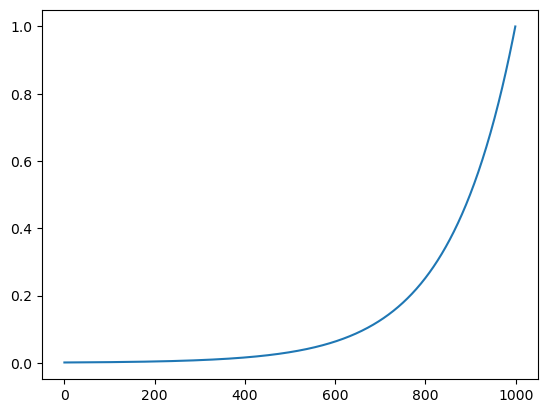

In [31]:
# Plot the search space; shows exponential search
plt.plot(lrs)

In [32]:
# Collect losses
losses = []

# Model Training
for e in range(1000): # iterationss

    # Batching
    batch_ix = torch.randint(0, X.shape[0], (32,)) # batch size of 32
    
    #  FORWARD PASS
    # Emedding layer
    emb = C[X[batch_ix]] #Embeddig size will now be 32x3x2

    # Hidden layer
    h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100

    # Output layer
    logits = (h @ W2 + b2)

    # Loss: cross-entropy
    loss=F.cross_entropy(logits, Y[batch_ix])
    losses.append(loss.item())
    print(loss)

    # BACKWARD PASS
    for p in params:
        p.grad=None # Same as setting it to 0

    # Backprop
    loss.backward()

    # Gradient descent + adaptive learning rate
    lr=lrs[e]
    for p in params:
        p.data+=-lr*p.grad

tensor(20.8961, grad_fn=<NllLossBackward0>)
tensor(20.0575, grad_fn=<NllLossBackward0>)
tensor(19.0062, grad_fn=<NllLossBackward0>)
tensor(17.5342, grad_fn=<NllLossBackward0>)
tensor(21.9686, grad_fn=<NllLossBackward0>)
tensor(20.0251, grad_fn=<NllLossBackward0>)
tensor(22.5367, grad_fn=<NllLossBackward0>)
tensor(15.4698, grad_fn=<NllLossBackward0>)
tensor(16.9312, grad_fn=<NllLossBackward0>)
tensor(17.3561, grad_fn=<NllLossBackward0>)
tensor(22.2003, grad_fn=<NllLossBackward0>)
tensor(18.5624, grad_fn=<NllLossBackward0>)
tensor(21.5130, grad_fn=<NllLossBackward0>)
tensor(19.2783, grad_fn=<NllLossBackward0>)
tensor(17.5520, grad_fn=<NllLossBackward0>)
tensor(16.1395, grad_fn=<NllLossBackward0>)
tensor(18.3891, grad_fn=<NllLossBackward0>)
tensor(19.1517, grad_fn=<NllLossBackward0>)
tensor(17.6880, grad_fn=<NllLossBackward0>)
tensor(16.2537, grad_fn=<NllLossBackward0>)
tensor(17.6835, grad_fn=<NllLossBackward0>)
tensor(20.4352, grad_fn=<NllLossBackward0>)
tensor(18.2798, grad_fn=<NllLoss

We can now plot the relationship between loss and learning rate:

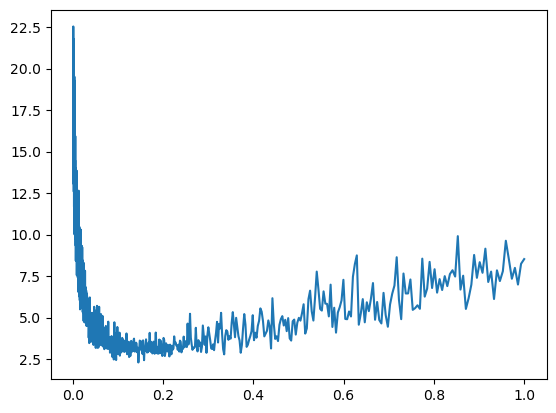

In [33]:
# Plot x=learning rate, y=losses
plt.plot(lrs, losses)

We find an L-shape pattern. At the beginning, with a small learning rate the loss is as high as it can get. With decreasing the rate we find the optimla spot with quite mall rate. Increasing from this valley only increases the loss, which is indicates a too large rate. The optimal learning rate is the one where the loss is minimal.In this case, it appeats to be that it is $.1$

## Train, validation, and test sets

A complex NN tat performs well on the training data has to be evaluated on unseen data to gauge its true out-of-the-distribution performance. We next split the data into training, validation, and test datasets.

- Training set: optimise paramters of the model

- Validation: used to find optimal hyperparamters, such as size of the hidden layer, the number of embedding dimensions

- Test: used to assess the final prediction accuracy of the net

We add three extensions to the network:

1. We also increase the size of the hidden layer to allow for a bigger neural net which should lead to a lower loss. 

2. We also increase the size of the embedding layer, as for now, all the chr infomation are squeezed into 2 dimensions only.

3. We implementd learning rate decay, by reducing the learning rate after the half of the training.

This increases the NN to about 12k paramters. In production, however, the optimal number of hyperparamters would be chosen using cross-validation.

In [34]:
# Build sets
# Data set
block_size=3 # Context window
X, Y = [], [] # In- and output

for word in words:
    context = [0]*block_size # creates the context window which is populated next; also sets the beginning chars

    for char in word + '.':
        ix=stoi[char]
        X.append(context)
        Y.append(ix)
        
        # Update context: last two become first two + new token
        context=context[1:] + [ix]
        
# Create tensors
X = torch.tensor(X)
Y = torch.tensor(Y)

# Split into train, dev, test
random.seed(42)
random.shuffle(words) # Shuffle order
n1 = int(.8*len(words)) # Get ints for .8 and .9 percent of the data
n2 = int(.9*len(words))

Xtr, Ytr = X[:n1], Y[:n1]
Xdev, Ydev = X[n1:n2], Y[n1:n2]
Xte, Yte = X[n2:], Y[n2:]

### Training

This means that we train the model only on the designated training `X` and `Y`.

In [35]:
# PARAMETERS
# Set seed
g = torch.Generator().manual_seed(2147483647)

# Embedding matrix
C = torch.randn((27, 4), generator=g) # Size of vocabulary x embedding size

# Hidden layer
W1 = torch.randn((3*4, 300), generator=g)
b1 = torch.randn((300), generator=g)

# Output layer
W2 = torch.randn((300, 27), generator=g)
b2 = torch.randn((27), generator=g)

# Params list
params = [C, W1, b1, W2, b2]

# Set gradients
for p in params:
    p.requires_grad=True

In [36]:
# Print n of paramters
print('Params n ', sum(p.nelement() for p in params))

Params n  12135


In [37]:
# Model Training
for e in range(200000): # iterations

    # Batching
    batch_ix = torch.randint(0, Xtr.shape[0], (32,)) # batch size of 32
    
    #  FORWARD PASS
    # Emedding layer
    emb = C[Xtr[batch_ix]] #Embeddig size will now be 32x3x2

    # Hidden layer
    h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100

    # Output layer
    logits = (h @ W2 + b2)

    # Loss: cross-entropy
    loss=F.cross_entropy(logits, Ytr[batch_ix])
    print(loss)

    # BACKWARD PASS
    for p in params:
        p.grad=None # Same as setting it to 0

    # Backprop
    loss.backward()

    # Learning rate
    lr = .1 if e < 100000 else .01
    
    # Gradient descent
    for p in params:
        p.data+=-lr*p.grad

tensor(26.6231, grad_fn=<NllLossBackward0>)
tensor(28.4396, grad_fn=<NllLossBackward0>)
tensor(29.4072, grad_fn=<NllLossBackward0>)
tensor(20.9979, grad_fn=<NllLossBackward0>)
tensor(21.2136, grad_fn=<NllLossBackward0>)
tensor(21.5333, grad_fn=<NllLossBackward0>)
tensor(24.0321, grad_fn=<NllLossBackward0>)
tensor(21.2832, grad_fn=<NllLossBackward0>)
tensor(22.0983, grad_fn=<NllLossBackward0>)
tensor(17.9676, grad_fn=<NllLossBackward0>)
tensor(22.2387, grad_fn=<NllLossBackward0>)
tensor(19.5518, grad_fn=<NllLossBackward0>)
tensor(16.4062, grad_fn=<NllLossBackward0>)
tensor(15.7910, grad_fn=<NllLossBackward0>)
tensor(13.7049, grad_fn=<NllLossBackward0>)
tensor(12.8738, grad_fn=<NllLossBackward0>)
tensor(12.3188, grad_fn=<NllLossBackward0>)
tensor(18.4005, grad_fn=<NllLossBackward0>)
tensor(13.9605, grad_fn=<NllLossBackward0>)
tensor(11.9855, grad_fn=<NllLossBackward0>)
tensor(11.8966, grad_fn=<NllLossBackward0>)
tensor(14.6846, grad_fn=<NllLossBackward0>)
tensor(15.8481, grad_fn=<NllLoss

### Validation

We validate the training above on the entire data of the validation set. The key is that the NN has not seen the validation inut during training. It is thus the fist true assessment of how well the model performs on new data.

In [225]:
#  FORWARD VALIDATION DATA

# Emedding layer
emb = C[Xdev] # Embeddig size will now be 32x3x2

# Hidden layer
h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100

# Output layer
logits = (h @ W2 + b2)

# Loss: cross-entropy
loss=F.cross_entropy(logits, Ydev)
print(loss)

tensor(2.4251, grad_fn=<NllLossBackward0>)


We can now compare the validation loss to the training loss:

In [226]:
#  FORWARD VALIDATION DATA

# Emedding layer
emb = C[Xtr] # Embeddig size will now be 32x3x2

# Hidden layer
h = torch.tanh(emb.view(emb.shape[0], block_size*emb.shape[2]) @ W1 + b1) # 32x100

# Output layer
logits = (h @ W2 + b2)

# Loss: cross-entropy
loss=F.cross_entropy(logits, Ytr)
print(loss)

tensor(2.0247, grad_fn=<NllLossBackward0>)


We see that we achive a lower loss on the validation set than we had before. The lower loss on traing than on valdiation is an indication than we might overfit the teaining data. but we used the validation fit to find the lowest possible loss by changing the a) learning rate, b) size of the hidden layer, and 3) size of the embedding dimensions.

__Further optimisation__

This is the way we would optimise this neural net. Ideally, as mentioned above, we would run mutliple tests on hyperparamters and pick the model which achives the best validation loss. This is choosen and just one single time evaluated on the test set, which is the final number/evaluation of the NN. We could go ahead and fine-tune:

1. Hidden layer size

2. Number of hidden layers

3. Dimension of embedding size

4. Number of chars to feed into the net

5. Learning rate, learning rate decay, number of iterations

6. Batch size

### Name generation/model sampling

In [230]:
C[torch.tensor(context)]

tensor([[ 2.2103, -2.7266, -0.0889, -1.3067],
        [ 2.2103, -2.7266, -0.0889, -1.3067],
        [ 2.2103, -2.7266, -0.0889, -1.3067]], grad_fn=<IndexBackward0>)

In [237]:
for _ in range(20): # gen 20 names

    out=[]
    context=[0]*3 # Initialise input ...
    while True:
        emb=C[torch.tensor(context)] # Select context emebeddings from C; returns 3xemb dims

        # Get predicions
        h = torch.tanh(emb.view(1, -1) @ W1 + b1) # 1x12 (1=one context; 12 (or -1) is emb_size x block_size)
        logits = (h @ W2 + b2)
        probs=F.softmax(logits, dim=1)

        ix = torch.multinomial(probs, num_samples=1).item() # Randomly sample
        out.append(itos[ix])

        context=context[1:] + [ix] # Shift context with the newly samples token

        if ix==0:
            print(''.join(out))
            break
            
        

devoney.
alike.
tatia.
aer.
joni.
ran.
adonaiya.
ashniri.
jalenisa.
yaye.
datelbeel.
rolleighn.
tafa.
malment.
caer.
bamira.
halaholey.
daan.
koletsion.
adyape.


## Visualisation

to be done